### "folium" pour des représentations cartographiques interactives 

#### "folium" s'appuie sur les forces de traitement des données de l'écosystème Python et sur les forces de cartographie de la bibliothèque leaflet.js. Manipulez vos données en Python, puis visualisez-les sur une carte Leaflet interactive via folium

#### Dans ce natebook je vais développer les scripts permettant d'importer des données (à partir de la Base Permanente des Equipements de France de l'année 2020), de faire des filtes et ensuite des jointures permettant d'associer deux jeux de données, d'afficher le résultat sous forme d'une carte de dépliants interactive des boulangeries répertoriées dans la BPE de 2020 et enfin des statistiques descriptives permettant de savoir les secteurs géographiques où se concentrent le plus de boulangeries dans le territoire de la Région Normandie

In [1]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv(r'C:\Users\Chibane\boulangeries_Region_Normandie_WGS84.csv')
data.head()

,AAV2020,AN,BV2012,DCIRIS,DEP,DEPCOM,EPCI,LABEL,LAMBERT_X,LAMBERT_Y,QUALITE_XY,REG,TYPEQU,UU2020,X,Y
0,24.0,2020,14118,14009,14,14009,200065563,X,464551.43,6910314.21,Bonne,28,B203,NaN,-0.234158,49.249094
1,24.0,2020,14752,14011,14,14011,200069524,X,430850.00,6901850.00,Acceptable,28,B203,NaN,-0.691023,49.159790
2,238.0,2020,14225,14016,14,14016,241400878,X,485650.00,6910250.00,Mauvaise,28,B203,NaN,0.055406,49.255936
3,24.0,2020,14020,14020,14,14020,200065589,X,469064.45,6896473.08,Bonne,28,B203,14210.0,-0.164618,49.126403
4,24.0,2020,14020,14020,14,14020,200065589,X,469109.54,6896362.23,Bonne,28,B203,14210.0,-0.163940,49.125423


In [3]:
data.columns

Index(['AAV2020', 'AN', 'BV2012', 'DCIRIS', 'DEP', 'DEPCOM', 'EPCI', 'LABEL',
       'LAMBERT_X', 'LAMBERT_Y', 'QUALITE_XY', 'REG', 'TYPEQU', 'UU2020', 'X',
       'Y'],
      dtype='object')

In [4]:
df = data.filter(["X","Y","EPCI","DEPCOM","LABEL","TYPEQU","QUALITE_XY", "DCIRIS"])
df.head()

,X,Y,EPCI,DEPCOM,LABEL,TYPEQU,QUALITE_XY,DCIRIS
0,-0.234158,49.249094,200065563,14009,X,B203,Bonne,14009
1,-0.691023,49.159790,200069524,14011,X,B203,Acceptable,14011
2,0.055406,49.255936,241400878,14016,X,B203,Mauvaise,14016
3,-0.164618,49.126403,200065589,14020,X,B203,Bonne,14020
4,-0.163940,49.125423,200065589,14020,X,B203,Bonne,14020


In [5]:
#Create a map
m = folium.Map(location=[49.027094, 0.086480], control_scale=True, zoom_start=7,attr = "text some")
df_copy = df.copy()

In [6]:

# loop through data to create Marker for each hospital
for i in range(0,len(df_copy)):
    
    # html to be displayed in the popup 
    html="""
    <h4> Hospital name: </h4>""" + str(df_copy.iloc[i]['LABEL'])+ \
    """<h4>Type:</h4>""" + str(df_copy.iloc[i]['TYPEQU']) +" B203" +\
    """<h4>Address:</h4>""" + str(df_copy.iloc[i]['QUALITE_XY'])+" "+ str(df_copy.iloc[i]['X'])+" "+ str(df_copy.iloc[i]['Y'])
    
    #IFrame 
    iframe = folium.IFrame(html=html, width=200, height=300)
    popup = folium.Popup(iframe, max_width=2650)
    
    #If you do not want html in popup this would be the alternative code ->
    #popup = html("<b>HOSPITAL NAME:</b> "+str(df_copy.iloc[i]['LabelName'])+"<br/><br/><b>TYPE:</b> "+str(df_copy.iloc[i]['Type']) +" hospital"\
   # +"<br/><br/> <b>ADDRESS:</B> " + str(df_copy.iloc[i]['StreetNum'])+" "+ str(df_copy.iloc[i]['RoadName'])+" "+ str(df_copy.iloc[i]['RoadType'])),
    
    folium.Marker(
    location=[df_copy.iloc[i]['Y'], df_copy.iloc[i]['X']],
    popup=popup,
    tooltip=str(df_copy.iloc[i]['LABEL']),
    icon=folium.Icon(color='red',icon='star',prefix="fa", size="small"),
    ).add_to(m)
        
m

#### Je vais compter pour chaque commune le nombre de boulangeires en utilisant la fonction "groupby"

In [7]:
df_DEPCOM = data.groupby(['DEPCOM'],as_index=False)
DEPCOM_count = df_DEPCOM.count().filter(["DEPCOM","TYPEQU"])
DEPCOM_count = DEPCOM_count.sort_values(by="TYPEQU",ascending=False)
DEPCOM_count

,DEPCOM,TYPEQU
677,76351,130
731,76540,107
36,14118,99
345,50129,66
218,27229,40
...,...,...
352,50148,1
349,50145,1
348,50143,1
346,50137,1


##### La commune du Havre dont le code DEPCOM est "76351" arrive en tête et est dotée de 130 boulangeries ! 

#### J'importe le fichier contenant les cordonnées du Centroïde de chaque commune de la Région Normandie 

In [8]:
normandie_centroides = pd.read_csv(r'C:\Users\Chibane\GEO_TER_ADE_centroide_communes_Normandie_WGS_84_bis.csv')

In [9]:
normandie_centroides.head()

,id,nom_com,nom_com_m,insee_com,statut,population,insee_arr,insee_dep,insee_reg,code_epci,X_COORD,Y_COORD,X,Y
0,COMMUNE_0000000009736697,Saint-Michel-de-Montjoie,SAINT-MICHEL-DE-MONTJOIE,50525,Commune simple,314,1,50,28,200069425,404175.70222,6.859141e+06,-1.026376,48.764481
1,COMMUNE_0000000009736228,Champrepus,CHAMPREPUS,50118,Commune simple,337,4,50,28,200043354,383367.51686,6.868052e+06,-1.315667,48.834625
2,COMMUNE_0000000009731792,Franqueville-Saint-Pierre,FRANQUEVILLE-SAINT-PIERRE,76475,Commune simple,6123,3,76,28,200023414,568121.44257,6.924224e+06,1.183404,49.403839
3,COMMUNE_0000000009737606,Pointel,POINTEL,61332,Commune simple,330,2,61,28,200035814,453586.58440,6.849083e+06,-0.348944,48.694856
4,COMMUNE_0000000009731110,Bierville,BIERVILLE,76094,Commune simple,317,3,76,28,200070449,575099.06629,6.938861e+06,1.275084,49.536766


In [10]:
normandie_centroides.columns

Index(['id', 'nom_com', 'nom_com_m', 'insee_com', 'statut', 'population',
       'insee_arr', 'insee_dep', 'insee_reg', 'code_epci', 'X_COORD',
       'Y_COORD', 'X', 'Y'],
      dtype='object')

#### Je filtre ici pour garder que les colonnes qui m'intéressent

In [11]:
df1 = normandie_centroides.filter(["id", "nom_com_m", "insee_com", "statut", "population", "insee_arr", "insee_dep", "insee_reg", "code_epci", "X", "Y"])
df1

,id,nom_com_m,insee_com,statut,population,insee_arr,insee_dep,insee_reg,code_epci,X,Y
0,COMMUNE_0000000009736697,SAINT-MICHEL-DE-MONTJOIE,50525,Commune simple,314,1,50,28,200069425,-1.026376,48.764481
1,COMMUNE_0000000009736228,CHAMPREPUS,50118,Commune simple,337,4,50,28,200043354,-1.315667,48.834625
2,COMMUNE_0000000009731792,FRANQUEVILLE-SAINT-PIERRE,76475,Commune simple,6123,3,76,28,200023414,1.183404,49.403839
3,COMMUNE_0000000009737606,POINTEL,61332,Commune simple,330,2,61,28,200035814,-0.348944,48.694856
4,COMMUNE_0000000009731110,BIERVILLE,76094,Commune simple,317,3,76,28,200070449,1.275084,49.536766
...,...,...,...,...,...,...,...,...,...,...,...
2647,COMMUNE_0000000009736109,EZY-SUR-EURE,27230,Commune simple,3670,3,27,28,200040277,1.411650,48.871304
2648,COMMUNE_0000000009732771,VESLY,50629,Commune simple,725,3,50,28,200067031,-1.490393,49.246612
2649,COMMUNE_0000000009736706,CHERENCE-LE-HERON,50130,Commune simple,409,4,50,28,200043354,-1.201734,48.799554
2650,COMMUNE_0000000009737164,LE FRESNE-PORET,50193,Commune simple,216,1,50,28,200069425,-0.821142,48.707883


In [13]:
df1.columns

Index(['id', 'nom_com_m', 'insee_com', 'statut', 'population', 'insee_arr',
       'insee_dep', 'insee_reg', 'code_epci', 'X', 'Y'],
      dtype='object')

#### Je vais à présent fusionner les deux tables en se basant sur un champ commun

In [14]:
df_merged  = DEPCOM_count.merge(normandie_centroides,left_on='DEPCOM',right_on='insee_com',how="inner")
df_merged = df_merged.dropna()
communes_mieux_dotee = df_merged.sort_values(by="TYPEQU",ascending=False)
communes_mieux_dotee

,DEPCOM,TYPEQU,id,nom_com,nom_com_m,insee_com,statut,population,insee_arr,insee_dep,insee_reg,code_epci,X_COORD,Y_COORD,X,Y
0,76351,130,COMMUNE_0000000009731163,Le Havre,LE HAVRE,76351,Sous-Préfecture,170147,2,76,28,200084952,492852.56228,6.936969e+06,0.140978,49.498317
1,76540,107,COMMUNE_0000000009731460,Rouen,ROUEN,76540,Préfecture de Région,110145,3,76,28,200023414,561702.39987,6.928566e+06,1.093573,49.441498
2,14118,99,COMMUNE_0000000009733198,Caen,CAEN,14118,Préfecture,105354,2,14,28,200065597,454371.44304,6.903602e+06,-0.369893,49.184975
3,50129,66,COMMUNE_0000000009730180,Cherbourg-en-Cotentin,CHERBOURG-EN-COTENTIN,50129,Sous-Préfecture,79200,2,50,28,200067205,366182.90818,6.957837e+06,-1.620914,49.631761
4,27229,40,COMMUNE_0000000009735103,Evreux,EVREUX,27229,Préfecture,47733,3,27,28,200071454,564076.26582,6.881587e+06,1.141523,49.019784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,76527,1,COMMUNE_0000000009729479,Richemont,RICHEMONT,76527,Commune simple,453,1,76,28,200069722,602312.68766,6.968756e+06,1.643737,49.810111
518,76520,1,COMMUNE_0000000009729485,RÃƒÆ’Ã‚Â©alcamp,REALCAMP,76520,Commune simple,627,1,76,28,200069722,600768.30252,6.974402e+06,1.620931,49.860591
517,76517,1,COMMUNE_0000000009731112,Quincampoix,QUINCAMPOIX,76517,Commune simple,2994,3,76,28,200070449,568003.34708,6.937229e+06,1.177644,49.520673
516,76551,1,COMMUNE_0000000009730795,Sainneville,SAINNEVILLE,76551,Commune simple,846,2,76,28,200084952,504064.07367,6.942632e+06,0.292915,49.552736


#### Représentation graphique des communes les mieux dotées en boulangerie

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Communes les plus dotées en boulangeries'}, xlabel='nombre total de boulangeries', ylabel='Commune'>

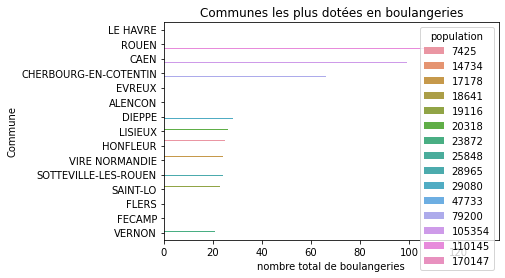

In [15]:
communes_mieux_dotee_15 = communes_mieux_dotee.head(15)
ax = sns.barplot(communes_mieux_dotee_15['TYPEQU'],communes_mieux_dotee_15['nom_com_m'],hue=communes_mieux_dotee_15['population'])
ax.set(xlabel="nombre total de boulangeries",ylabel="Commune",title="Communes les plus dotées en boulangeries")
ax

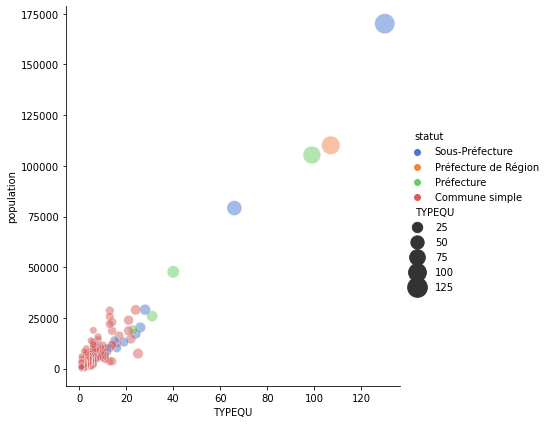

In [39]:
sns.relplot(x="TYPEQU", y="population", hue="statut", size="TYPEQU",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=communes_mieux_dotee)

##### Dessinez une carte thermique "heatmap" avec les valeurs numériques dans chaque cellule

<AxesSubplot:xlabel='DEPCOM', ylabel='nom_com_m'>

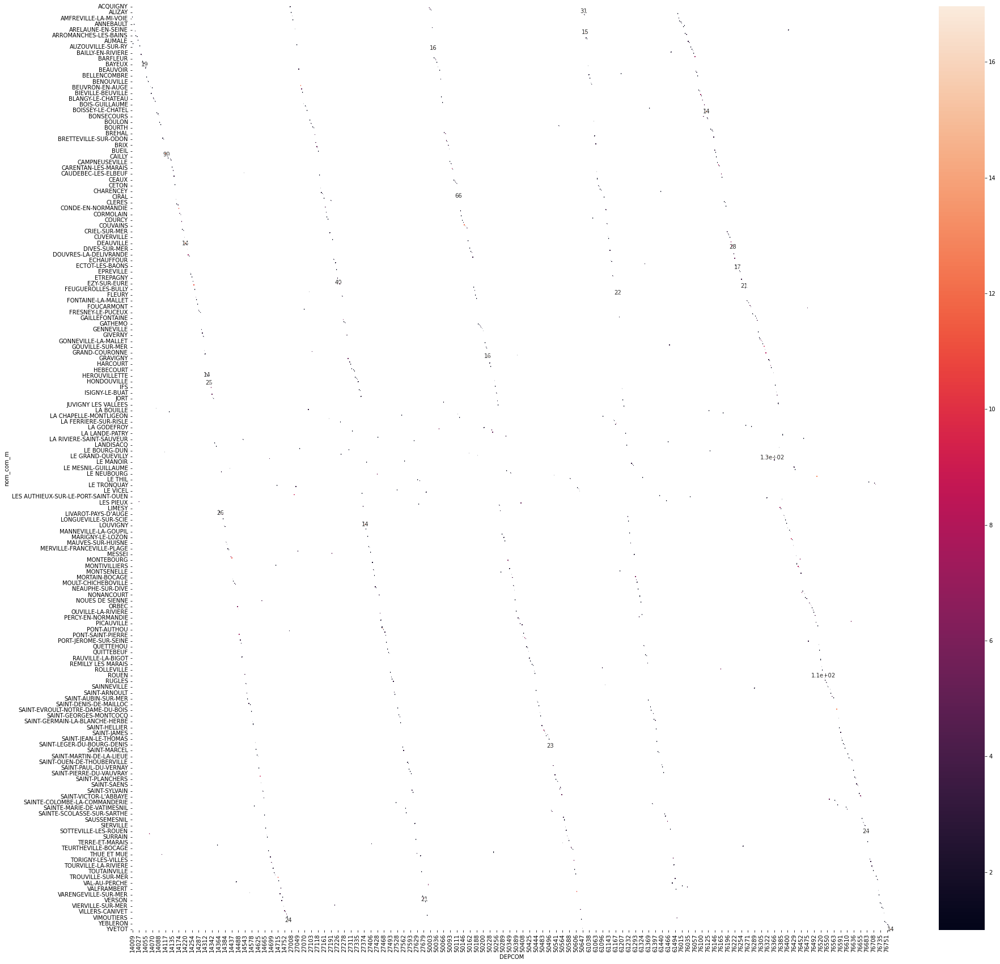

In [16]:
heat_map = communes_mieux_dotee.pivot("nom_com_m", "DEPCOM", "TYPEQU")

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(heat_map, annot=True, linewidths=0, ax=ax, robust=True)

#### Représentations cartographiques interactives

In [19]:
from folium.plugins import HeatMap
from folium.features import CustomIcon
m = folium.Map(location=[49.027094, 0.086480], control_scale=True, zoom_start=10,attr = "text some",tiles='cartodbdark_matter')
df_copy = df_merged.copy()
df_copy['count'] = 1

# create Folium circle
for i in range(0,len(df_copy)):
     # html to be displayed in the popup 
    html="""
    <h4> Commune: </h4>""" + str(df_copy.iloc[i]['nom_com_m'])+\
    """<h4>Code postal:</h4>""" + str(df_copy.iloc[i]['DEPCOM'])+\
    """<h4>Nombre de boulangeries:</h4>""" + str(df_copy.iloc[i]['TYPEQU'])
    
    #IFrame 
    iframe = folium.IFrame(html=html, width=200, height=300)
    popup = folium.Popup(iframe, max_width=2650)
    
    folium.Circle(
    location=[df_copy.iloc[i]['Y'], df_copy.iloc[i]['X']],
    radius=float(df_copy.iloc[i]['TYPEQU']*100),
    popup=popup,
    tooltip=str(df_copy.iloc[i]['nom_com_m']),
    color='crimson',
     fill=True,
     fill_color='green'
    ).add_to(m)
        
m

In [24]:
from folium.plugins import HeatMap
from folium.features import CustomIcon
m = folium.Map(location=[49.027094, 0.086480], control_scale=True, zoom_start=10,attr = "text some",tiles='cartodbdark_matter')
df_copy = df_merged.copy()
df_copy['count'] = 1

# create Folium circle
for i in range(0,len(df_copy)):
     # html to be displayed in the popup 
    html="""
    <h4> Commune: </h4>""" + str(df_copy.iloc[i]['nom_com_m'])+\
    """<h4>Code postal:</h4>""" + str(df_copy.iloc[i]['DEPCOM'])+\
    """<h4>Population:</h4>""" + str(df_copy.iloc[i]['population'])
    
    #IFrame 
    iframe = folium.IFrame(html=html, width=200, height=300)
    popup = folium.Popup(iframe, max_width=2650)
    
    folium.Circle(
    location=[df_copy.iloc[i]['Y'], df_copy.iloc[i]['X']],
    radius=float(df_copy.iloc[i]['TYPEQU']*100),
    popup=popup,
    tooltip=str(df_copy.iloc[i]['nom_com_m']),
    color='crimson',
     fill=True,
     fill_color='green'
    ).add_to(m)
        
m

In [25]:
from folium.plugins import HeatMap
from folium.features import CustomIcon
m = folium.Map(location=[49.027094, 0.086480], control_scale=True, zoom_start=10,attr = "text some",tiles='stamentoner')
df_copy = df_merged.copy()
df_copy['count'] = 1

# create Folium circle
for i in range(0,len(df_copy)):
     # html to be displayed in the popup 
    html="""
    <h4> Commune: </h4>""" + str(df_copy.iloc[i]['nom_com_m'])+\
    """<h4>Code postal:</h4>""" + str(df_copy.iloc[i]['DEPCOM'])+\
    """<h4>Population:</h4>""" + str(df_copy.iloc[i]['population'])
    
    #IFrame 
    iframe = folium.IFrame(html=html, width=200, height=300)
    popup = folium.Popup(iframe, max_width=2650)
    
    folium.Circle(
    location=[df_copy.iloc[i]['Y'], df_copy.iloc[i]['X']],
    radius=float(df_copy.iloc[i]['TYPEQU']*100),
    popup=popup,
    tooltip=str(df_copy.iloc[i]['nom_com_m']),
    color='crimson',
     fill=True,
     fill_color='green'
    ).add_to(m)
        
m

In [27]:
from folium.plugins import HeatMap
from folium.features import CustomIcon
m = folium.Map(location=[49.027094, 0.086480], control_scale=True, zoom_start=10,attr = "text some",tiles='cartodbdark_matter')
df_copy = df_merged.copy()
df_copy['count'] = 1

# create Folium circle
for i in range(0,len(df_copy)):
     # html to be displayed in the popup 
    html="""
    <h4> Commune: </h4>""" + str(df_copy.iloc[i]['nom_com_m'])+\
    """<h4>Code postal:</h4>""" + str(df_copy.iloc[i]['DEPCOM'])+\
    """<h4>Population:</h4>""" + str(df_copy.iloc[i]['population'])
    
    #IFrame 
    iframe = folium.IFrame(html=html, width=200, height=300)
    popup = folium.Popup(iframe, max_width=2650)
    
    folium.Circle(
    location=[df_copy.iloc[i]['Y'], df_copy.iloc[i]['X']],
    radius=float(df_copy.iloc[i]['TYPEQU']*100),
    popup=popup,
    tooltip=str(df_copy.iloc[i]['nom_com_m']),
    color='#044292',
     fill=True,
     fill_color='#f9e602'
    ).add_to(m)
        
m

#### Je vais à présent représenter le résultat sous forme d'une carte de chaleur "HeatMap" reflétant la concentration spatiale des boulangeries

In [28]:
m = folium.Map(location=[49.027094, 0.0864805], control_scale=True, zoom_start=10,attr = "text some",tiles='cartodbdark_matter')
df_copy = df.copy()
df_copy['count']=1
HeatMap(data=df_copy[['Y', 'X', 'count']].groupby(['Y', 'X']).sum().reset_index().values.tolist(),gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},radius=15, max_zoom=13).add_to(m)
m

In [30]:
m = folium.Map(location=[49.027094, 0.0864805], control_scale=True, zoom_start=10,attr = "text some",tiles='cartodbdark_matter')
df_copy = df.copy()
df_copy['count']=1
HeatMap(data=df_copy[['Y', 'X', 'count']].groupby(['Y', 'X']).sum().reset_index().values.tolist(),gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},radius=9, max_zoom=13).add_to(m)
m